# Reading a Buffer

This jupyter notebook reads a buffer and plots all it's attributes over the event numbers. You can use whichever buffer you want by simply selecting a data file and tweaking the appropriate parameters on the setup block below

In [1]:
# import necessary modules
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.colors import to_hex
from matplotlib.ticker import AutoMinorLocator
import numpy as np
import os

import raadpy as rp

# Define some constants
# raw_dir = '../../Data/RAW/'
SD      = '2022-09-07'
raw_dir = '../../Data/Light-1/light1-'+SD+'/'

# Get the subfiles and put the in a dictionary
fnames      = os.listdir(raw_dir)
filenames   = {}
for i in range(1,10): 
    res = [name for name in fnames if f'buff{i}' in name]
    if len(res)>0: filenames[f'buff{i}'] = res[0]

print(filenames)
%matplotlib widget

{'buff1': 'light1-2022-09-10-buff1.dat', 'buff2': 'light1-2022-09-07-buff2.dat', 'buff3': 'light1-2022-09-07-buff3.dat', 'buff4': 'light1-2022-09-12-buff4.dat', 'buff5': 'light1-2022-09-12-buff5.dat', 'buff6': 'light1-2022-NA-NA-buff6.dat', 'buff7': 'light1-2022-NA-NA-buff7.dat', 'buff8': 'light1-2022-NA-NA-buff8.dat', 'buff9': 'light1-2022-NA-NA-buff9.dat'}


# Orbit Buffer Data

First we collect the data from the orbit buffer, then we split based on the detector id and then plot

In [2]:
# Directory of the buffer
# buffer_fname    = raw_dir + SD + '/light1-'+SD+'-buff1.dat'
# Or:
buffer_fname    = raw_dir + filenames['buff1']

# Decode the buffer data in a dictionary
data_SiPM   = rp.get_dict(buffer_fname,struct=rp.ORBIT_STRUCT,condition="data['id_bit'] == 1")
data_PMT    = rp.get_dict(buffer_fname,struct=rp.ORBIT_STRUCT,condition="data['id_bit'] == 0")

Line:   0%|          | 0/7837 [00:00<?, ?it/s]

Line:   0%|          | 0/7837 [00:00<?, ?it/s]

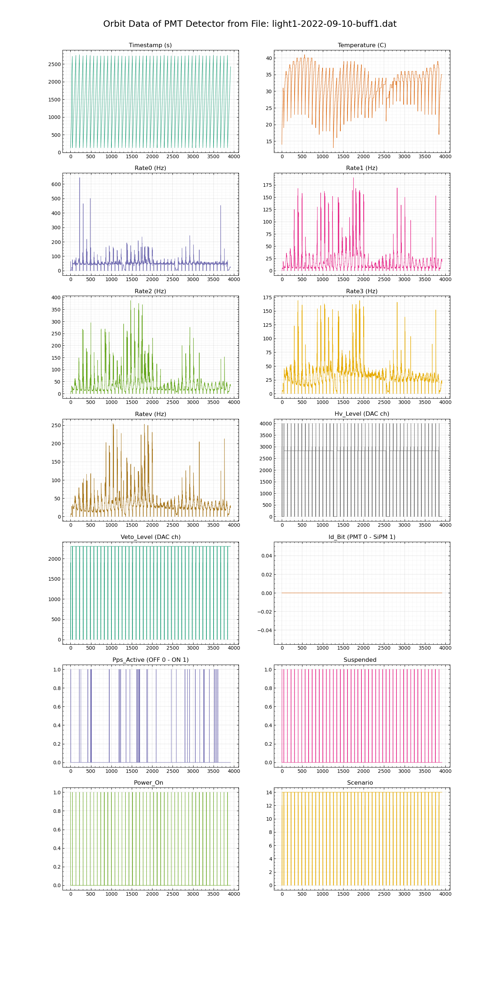

In [3]:
# Now print the PMT Data
fig, axes  = rp.plot_buffer(data_PMT,title = 'Orbit Data of PMT Detector from File: '+ filenames['buff1'],UNITS=rp.ORBIT_UNITS)

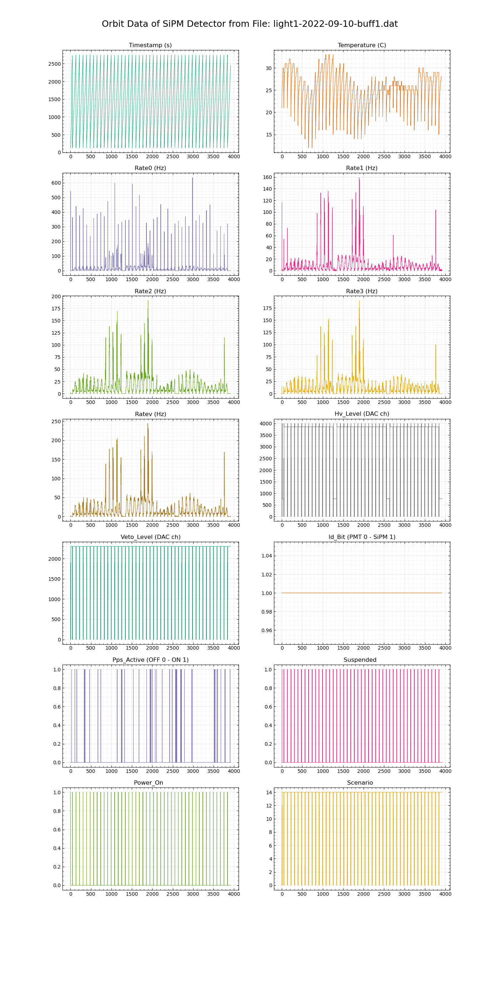

In [4]:
# Print the SiPM Data
fig, axes = rp.plot_buffer(data_SiPM, title = 'Orbit Data of SiPM Detector from File: '+ filenames['buff1'],UNITS=rp.ORBIT_UNITS)

# Veto Buffer Data

We collect both the PMT and SiPM data from the Veto buffers and then plot

In [5]:
# Directory of the buffer
buffer_fname    = raw_dir + filenames['buff6']

# Decode the buffer data in a dictionary
data_SiPM_v     = rp.get_dict(buffer_fname,struct=rp.VETO_STRUCT,MAX=None,STUPID=True)

# Directory of the buffer
buffer_fname    = raw_dir + filenames['buff7']

# Decode the buffer data in a dictionary
data_PMT_v      = rp.get_dict(buffer_fname,struct=rp.VETO_STRUCT,MAX=None,STUPID=True)

Line: : 0it [00:00, ?it/s]

Line: : 0it [00:00, ?it/s]

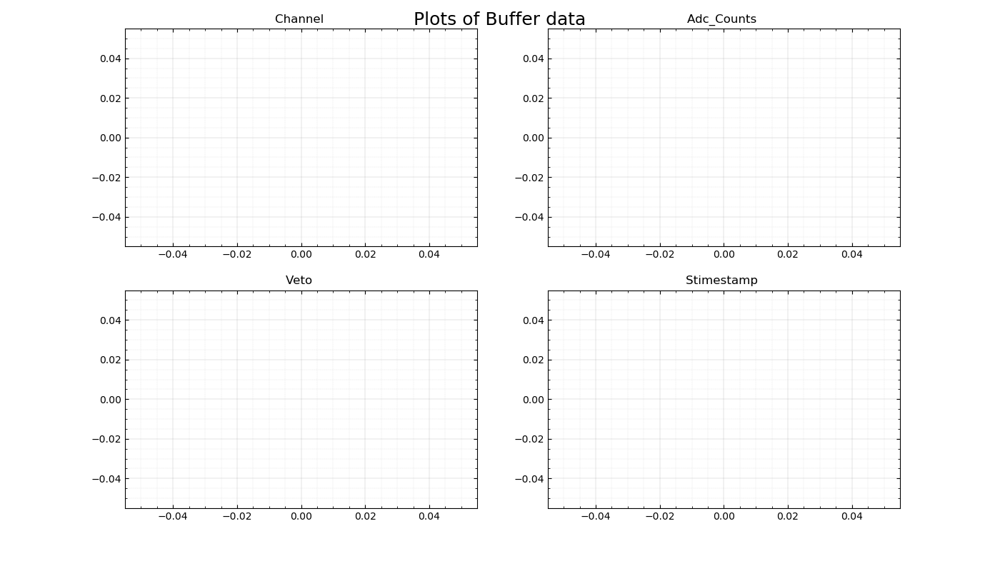

In [6]:
# Print the SiPM Data
fig, axes = rp.plot_buffer(data_SiPM_v)

In [7]:
# Plot histograms
fig,ax = rp.plot_hists(data_SiPM_v,struct=rp.VETO_STRUCT)

ValueError: Number of rows must be a positive integer, not 0

SystemError: tile cannot extend outside image

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous view', 'arrow-left', 'back'), ('Forward', 'Forward to next view', 'arrow-right', 'forward'), ('Pan', 'Left button pans, Right button zooms\nx/y fixes axis, CTRL fixes aspect', 'arrows', 'pan'), ('Zoom', 'Zoom to rectangle\nx/y fixes axis', 'square-o', 'zoom'), ('Download', 'Download plot', 'floppy-o', 'save_figure')]))

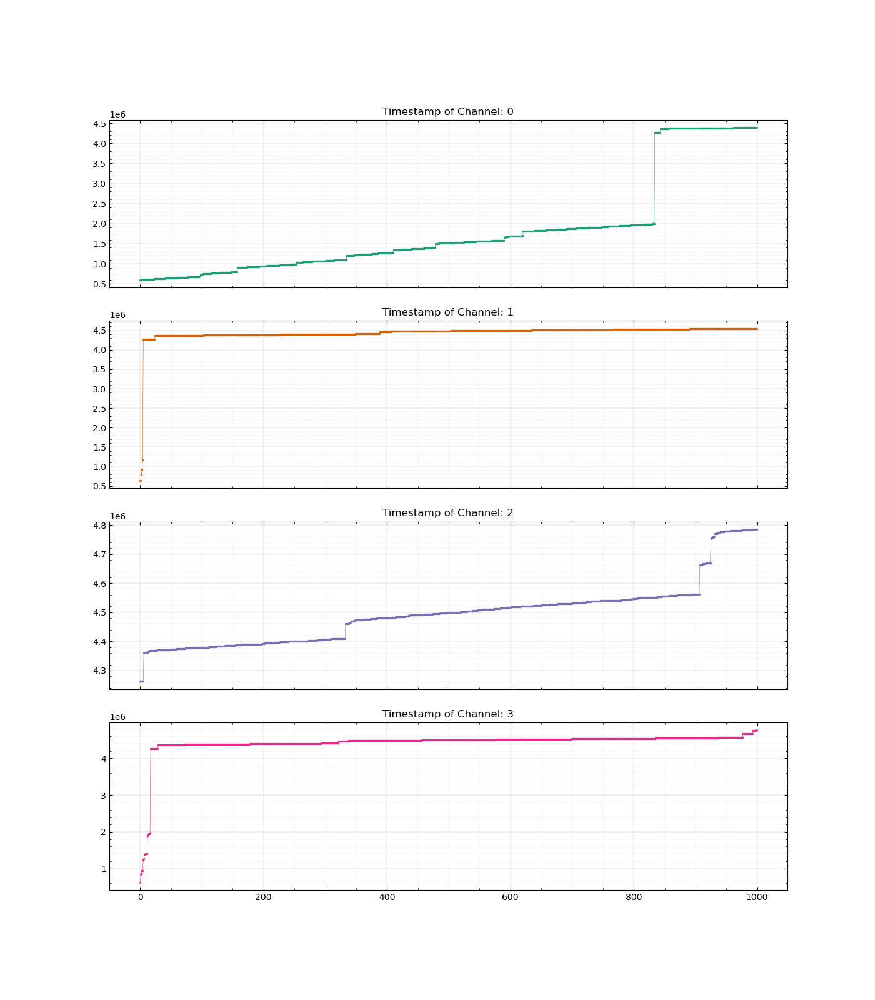

In [ ]:
# Plot timestamps
fig,ax = rp.plot_timestamps(data_SiPM_v,RANGE=(0,1000),struct=rp.VETO_STRUCT)

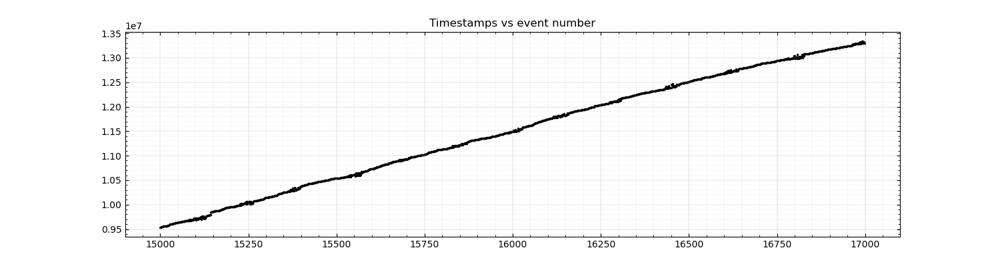

In [ ]:
# Plot timestamps of all events
fig,ax = rp.plot_timestamp(data_SiPM_v,RANGE=(15000,17000))

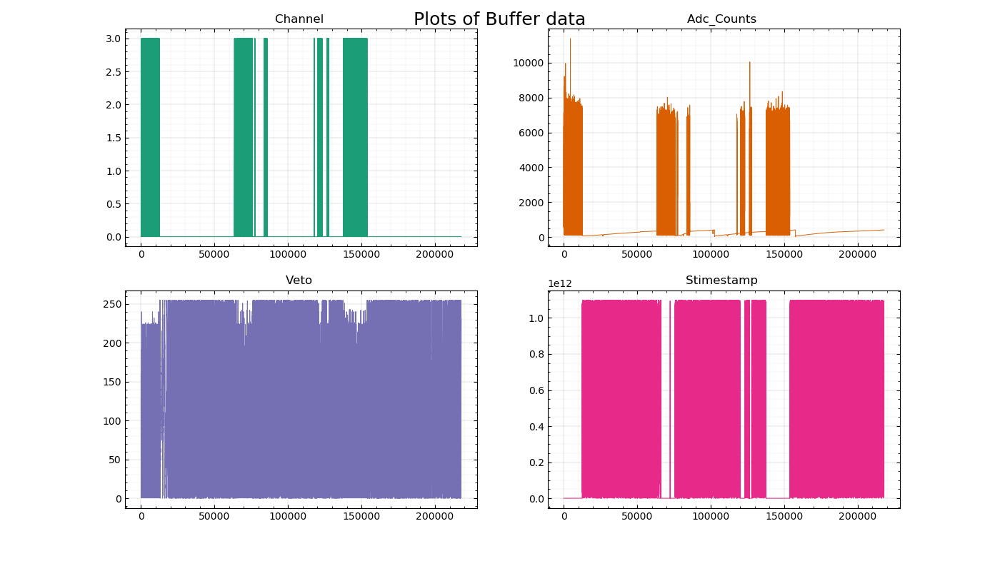

In [ ]:
# Now print the PMT Data
fig, axes = rp.plot_buffer(data_PMT_v)

In [8]:
# Plot histograms
fig,ax = rp.plot_hists(data_PMT_v,struct=rp.VETO_STRUCT)

ValueError: Number of rows must be a positive integer, not 0

SystemError: tile cannot extend outside image

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous view', 'arrow-left', 'back'), ('Forward', 'Forward to next view', 'arrow-right', 'forward'), ('Pan', 'Left button pans, Right button zooms\nx/y fixes axis, CTRL fixes aspect', 'arrows', 'pan'), ('Zoom', 'Zoom to rectangle\nx/y fixes axis', 'square-o', 'zoom'), ('Download', 'Download plot', 'floppy-o', 'save_figure')]))

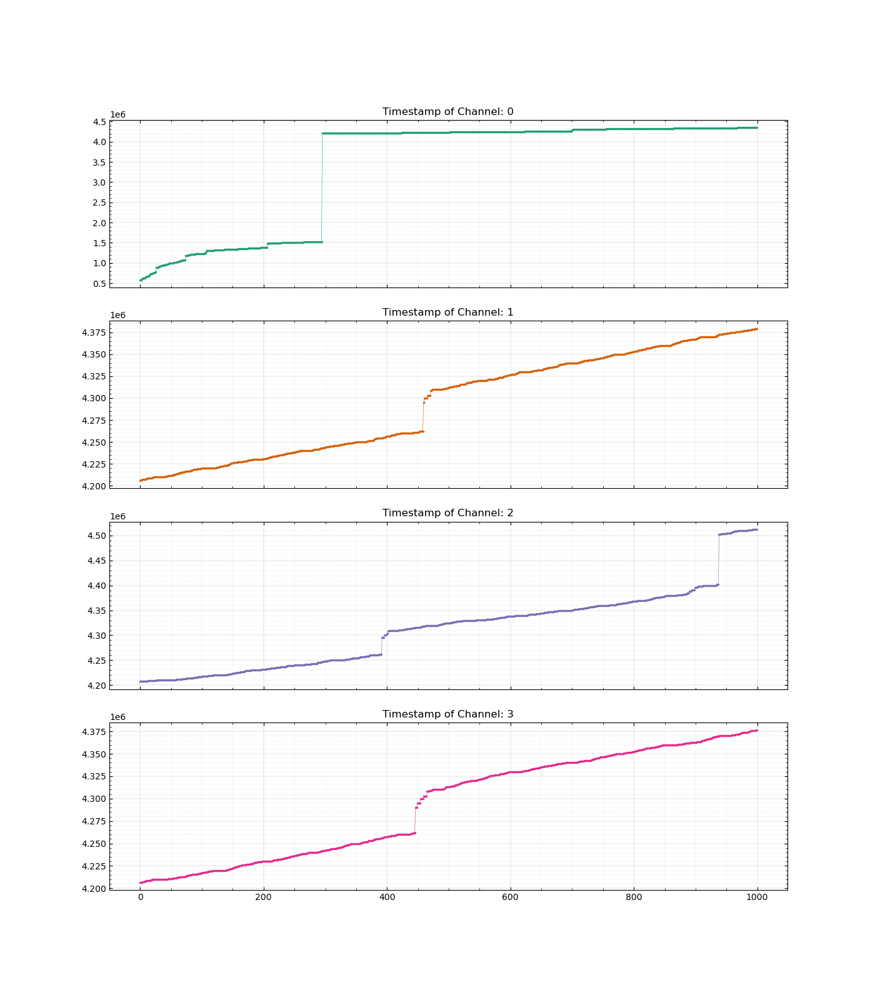

In [ ]:
# Plot timestamps
fig,ax = rp.plot_timestamps(data_PMT_v,RANGE=(0,1000),struct=rp.VETO_STRUCT)

ValueError: x and y must have same first dimension, but have shapes (1500,) and (0,)

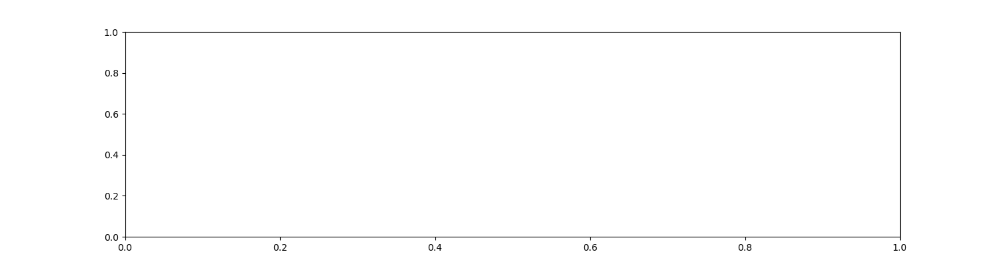

In [9]:
# Plot timestamps of all events
fig,ax = rp.plot_timestamp(data_PMT_v,RANGE=(0,1500))

# Non Veto Buffer Data

We collect both the PMT and SiPM data from the NON Veto buffers and then plot

In [17]:
# Directory of the buffer
buffer_fname    = raw_dir + filenames['buff4']

MAX = 0
for i in range(rp.NONVETO_STRUCT['stimestamp']+1):MAX += 2**i

# data_SiPM_nv    = rp.get_dict(buffer_fname,struct=rp.NONVETO_STRUCT,STUPID=True,MAX=10000000)

# Directory of the buffer
buffer_fname    = raw_dir + filenames['buff5']

# Decode the buffer data in a dictionary
data_PMT_nv     = rp.get_dict(buffer_fname,struct=rp.NONVETO_STRUCT,STUPID=True,VERIFY=True,threshold=5e-1)#,condition=f"data['stimestamp'] <= {5e6}")

Line:   0%|          | 0/716164 [00:00<?, ?it/s]

In [18]:
print(len(data_PMT_nv['stimestamp']))

716164


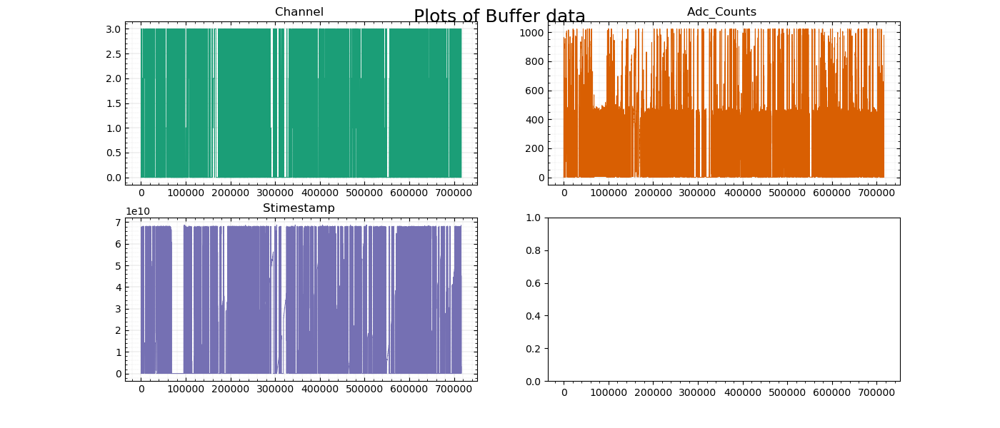

In [19]:
# Print the SiPM Data
fig, axes = rp.plot_buffer(data_PMT_nv)

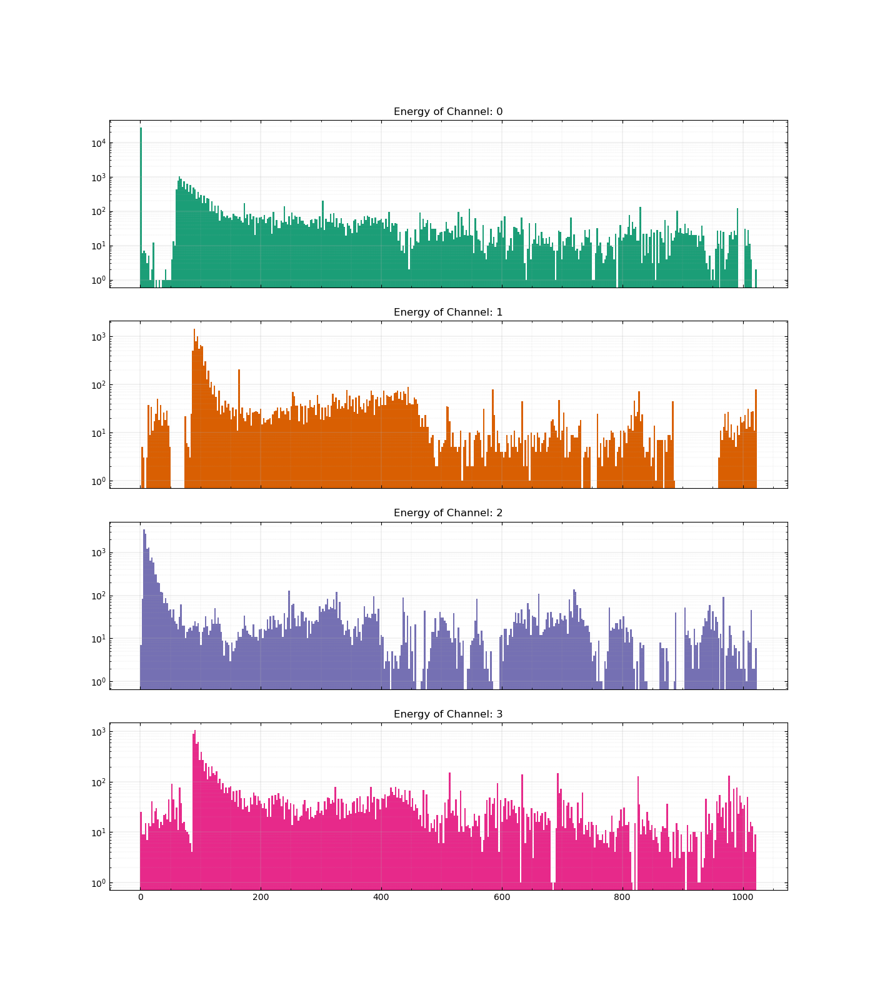

In [12]:
# Plot histograms
fig,ax = rp.plot_hists(data_PMT_nv,struct=rp.NONVETO_STRUCT,bins=400)

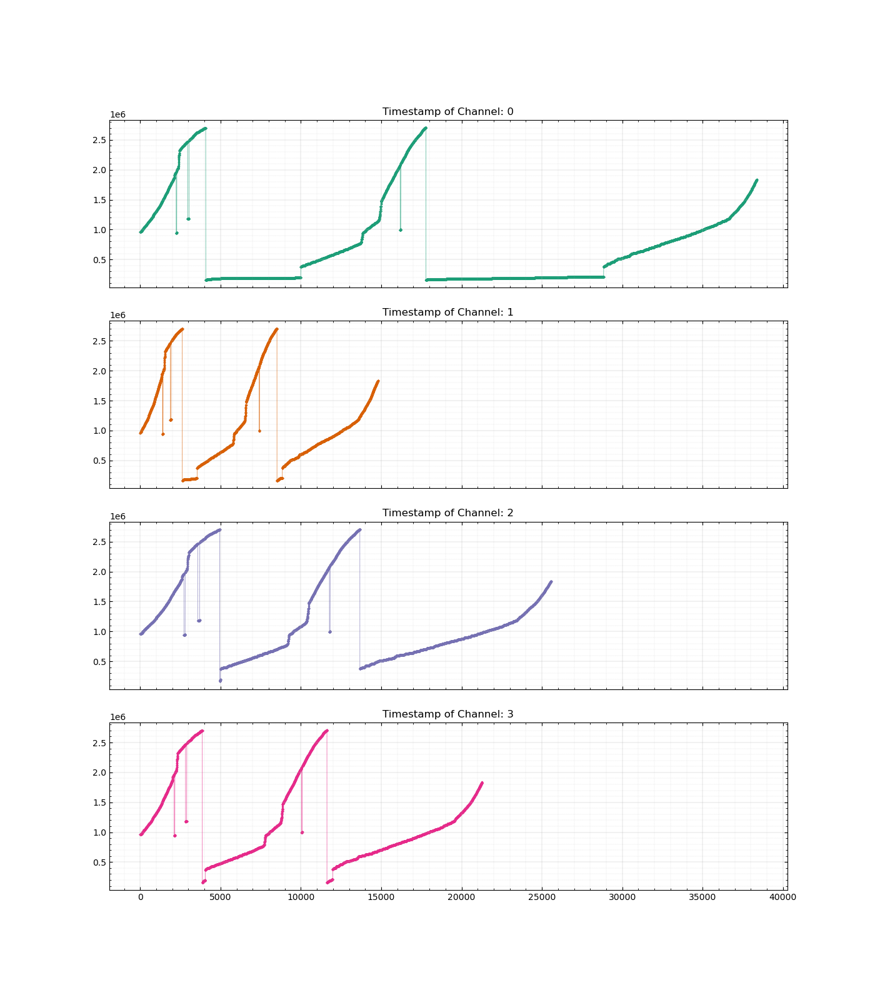

In [13]:
# Plot timestamps
fig,ax = rp.plot_timestamps(data_SiPM_nv,struct=rp.NONVETO_STRUCT)

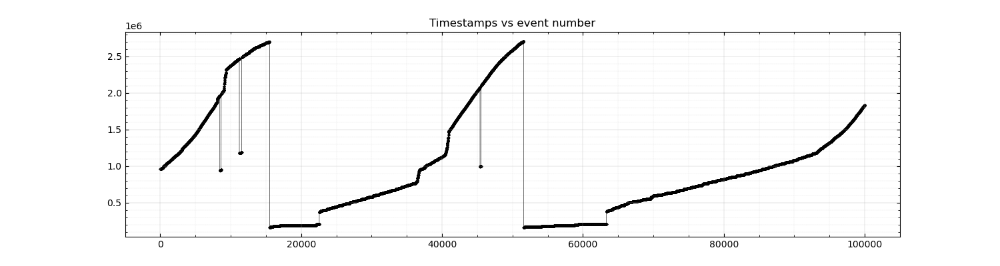

In [14]:
# Plot timestamps of all events
fig, ax = rp.plot_timestamp(data_SiPM_nv)

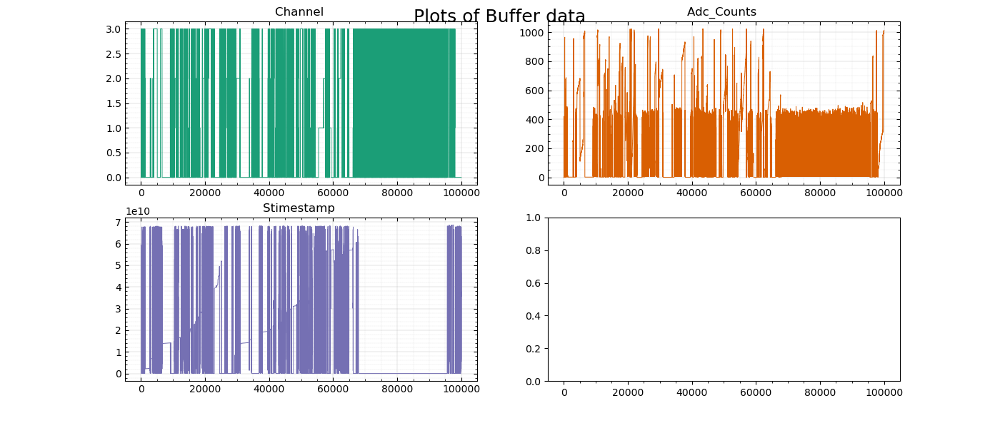

In [15]:
# Now print the PMT Data
fig, axes = rp.plot_buffer(data_PMT_nv)

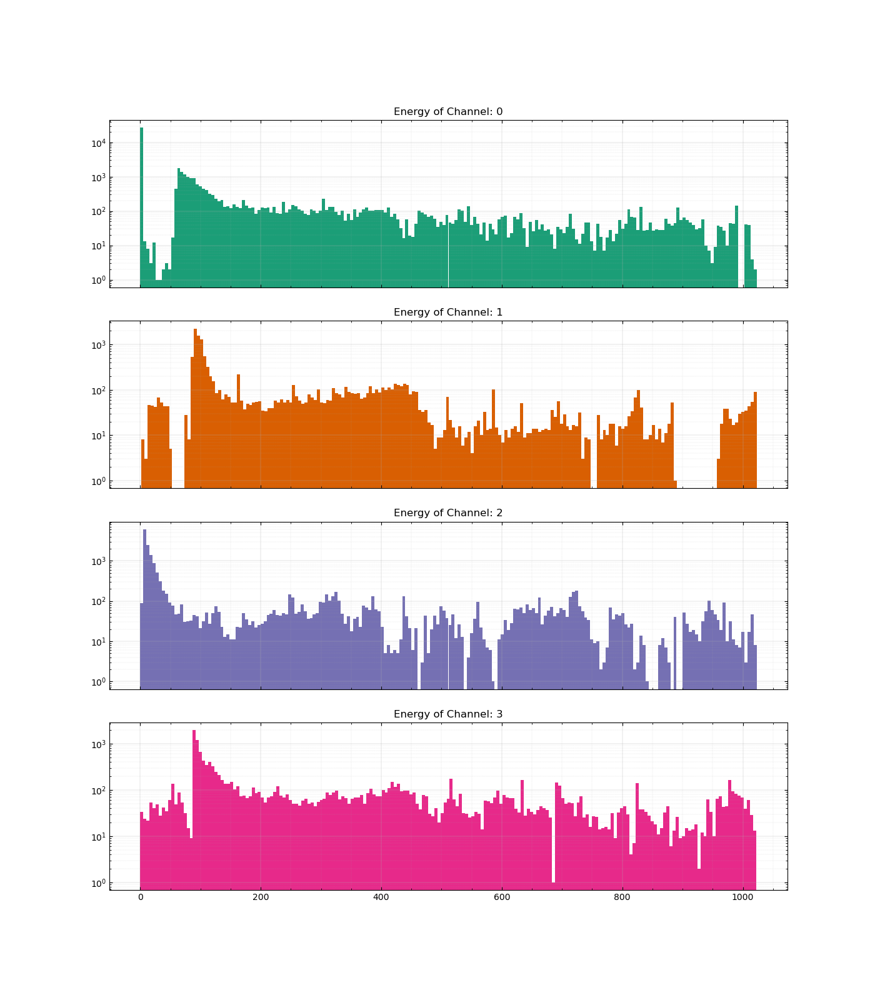

In [16]:
# Plot histograms
fig,ax = rp.plot_hists(data_PMT_nv,struct=rp.NONVETO_STRUCT,bins=200)

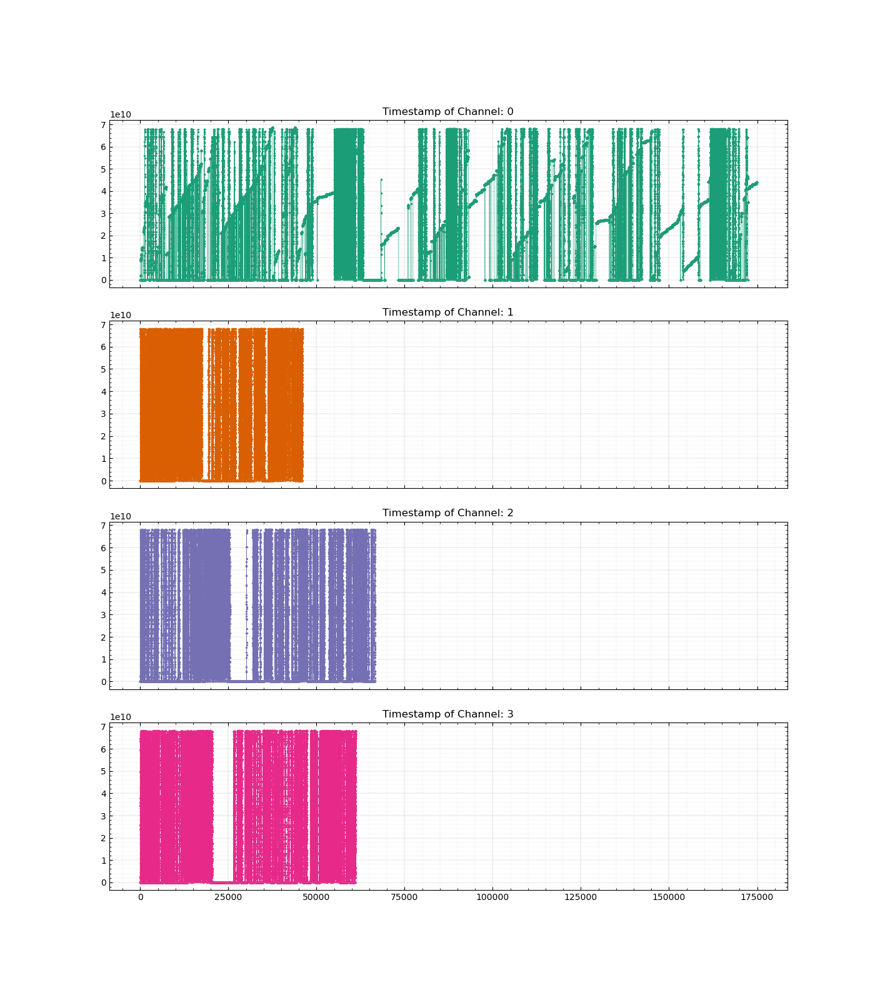

In [ ]:
# Plot timestamps
fig,ax = rp.plot_timestamps(data_PMT_nv,struct=rp.NONVETO_STRUCT)

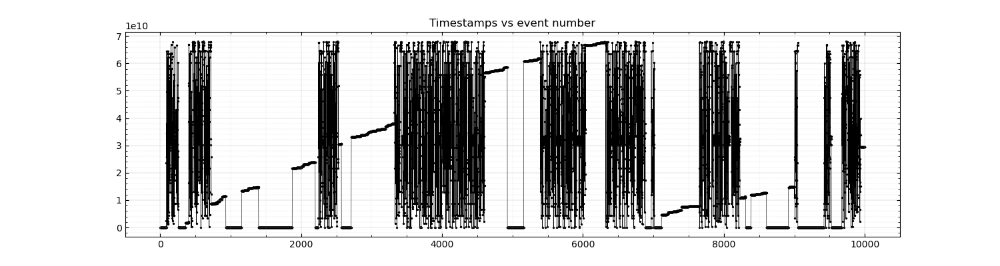

In [ ]:
# Plot timestamps of all events
fig, ax = rp.plot_timestamp(data_PMT_nv,RANGE=(0,10000))

# TGF Buffers

We collect both the PMT and SiPM data from the TGF buffers and then plot

In [ ]:
# Define a dictionary
TGF_STRUCT={
    'stimestamp': 48,
    'channel': 2,
    'adc_counts': 14,
}

# Directory of the buffer
buffer_fname    = raw_dir + filenames['buff2']

MAX = 281474976710656

# Decode the buffer data in a dictionary
data_SiPM_tgf    = rp.get_dict(buffer_fname,struct=TGF_STRUCT,STUPID=False)#,condition=f"data['stimestamp'] <= {MAX*0.09}")

# Directory of the buffer
buffer_fname    = raw_dir + filenames['buff3']

# Decode the buffer data in a dictionary
data_PMT_tgf     = rp.get_dict(buffer_fname,struct=TGF_STRUCT,STUPID=False,MAX=750)#,condition=f"data['stimestamp'] <= {MAX*0.09}")

Line:   0%|          | 0/339 [00:00<?, ?it/s]

Line:   0%|          | 0/750 [00:00<?, ?it/s]

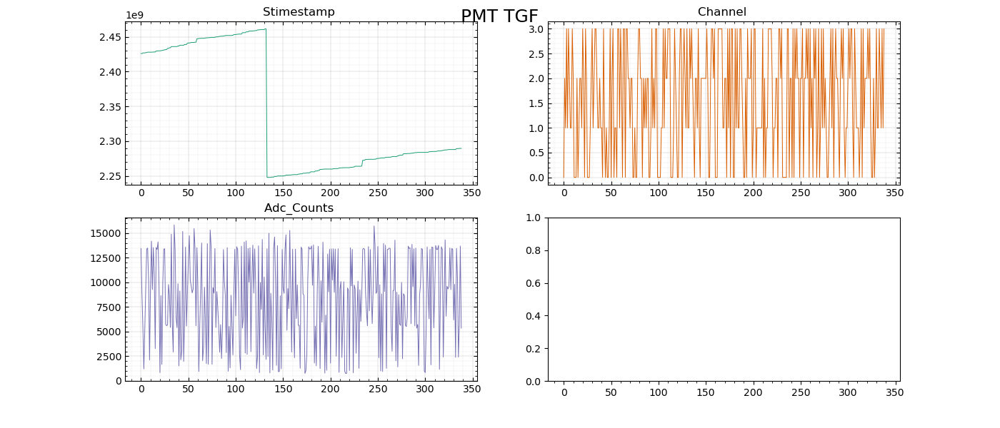

In [ ]:
# Now print the PMT Data
fig, axes = rp.plot_buffer(data_SiPM_tgf,title='PMT TGF')

In [ ]:
def get_consecutive_timestamps(data,gt=0, VERBOSE=True):
    unique_times, unique_freq = np.unique(data['stimestamp'],return_counts=True)
    idx = np.where(unique_freq>gt)[0]
    times = unique_times[idx]

    if VERBOSE:
        print(len(times))
        for i,j in zip(unique_freq[idx],times):
            print("%2d\t%.1f"%(i,j))

    return times, unique_freq[idx]

times, freq = get_consecutive_timestamps(data_PMT_tgf,3)

18
 5	1219999999.0
23	2897999999.0
12	2899999999.0
30	2901999999.0
30	2903999999.0
34	2905999999.0
24	2907999999.0
26	2909999999.0
28	2911999999.0
21	2913999999.0
15	2915999999.0
30	2917999999.0
20	2919999999.0
21	2925999999.0
22	2929999999.0
16	2931999999.0
14	2933999999.0
16	2935999999.0


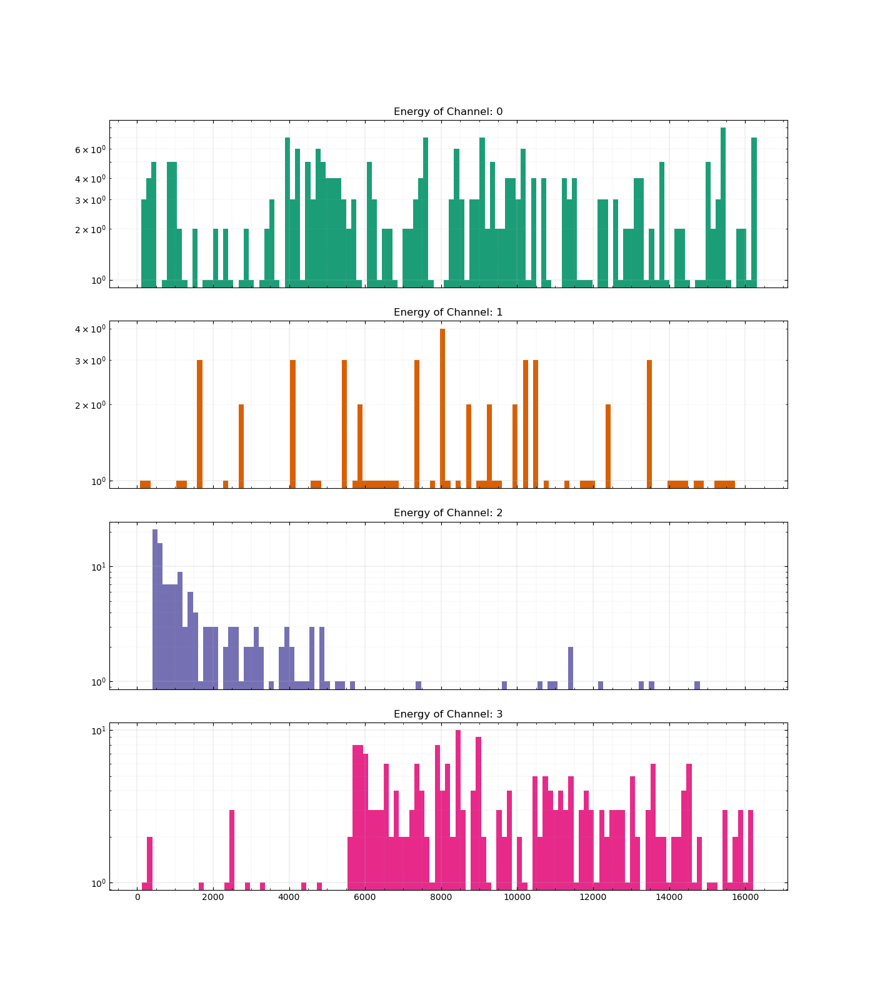

In [ ]:
# Plot histograms
fig,ax = rp.plot_hists(data_PMT_tgf,struct=TGF_STRUCT,bins=120)

In [ ]:
750/(2*60**2)

0.10416666666666667

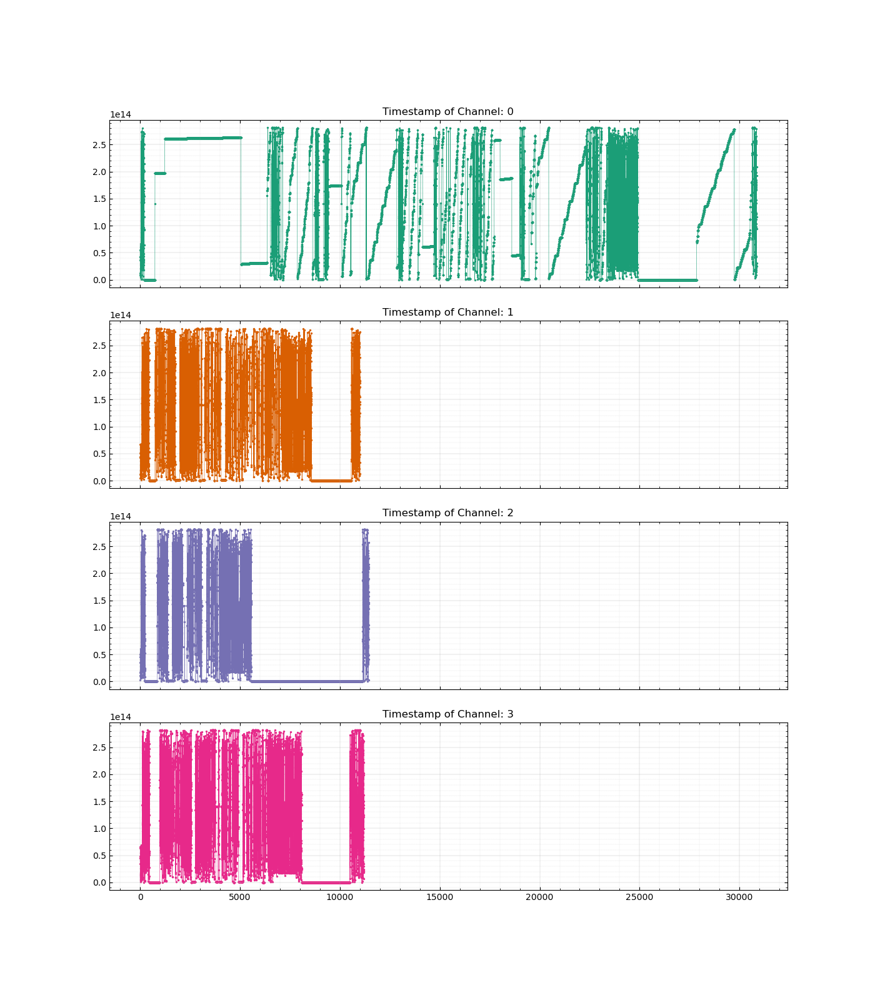

In [ ]:
fig,ax = rp.plot_timestamps(data_PMT_tgf,struct=TGF_STRUCT)

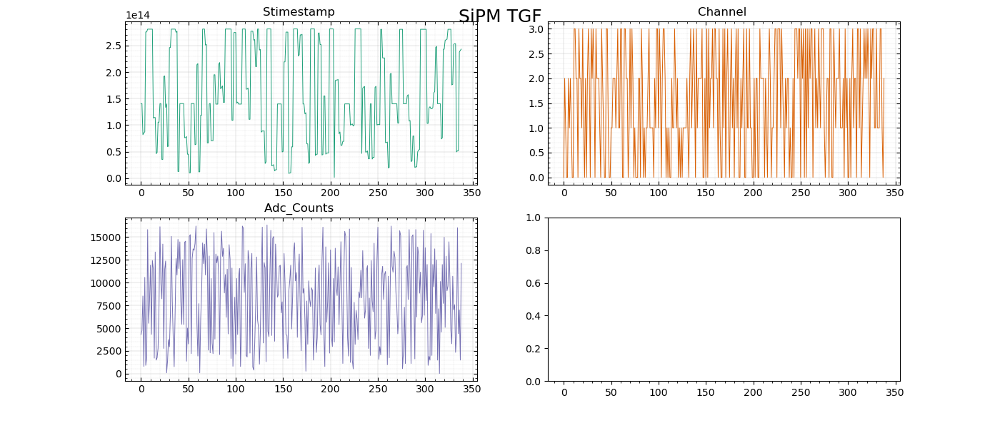

In [ ]:
# Now print the SiPM Data
fig, axes = rp.plot_buffer(data_SiPM_tgf,title='SiPM TGF')

In [ ]:
times, freq = get_consecutive_timestamps(data_SiPM_tgf,3)

20
 5	2247999999.0
 5	2249999999.0
 5	2251999999.0
 5	2255999999.0
 4	2259999999.0
 6	2261999999.0
 7	2263999999.0
 6	2277999999.0
 4	2279999999.0
 4	2281999999.0
 7	2283999999.0
 4	2285999999.0
 4	2287999999.0
 6	2427999999.0
 5	2435999999.0
 5	2437999999.0
 4	2441999999.0
 7	2451999999.0
 4	2453999999.0
 4	2455999999.0


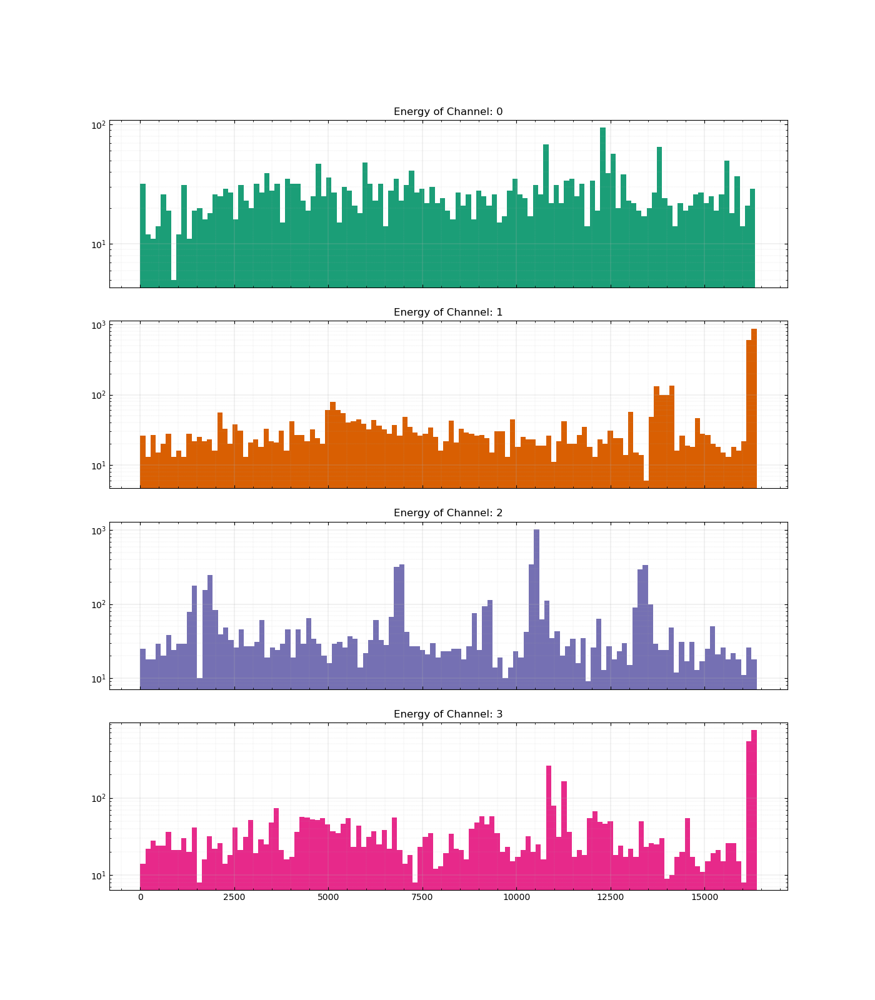

In [ ]:
# Plot histograms
fig,ax = rp.plot_hists(data_SiPM_tgf,struct=TGF_STRUCT,bins=120)

In [ ]:
print(rp.NONVETO_STRUCT)

{'channel': 2, 'adc_counts': 10, 'stimestamp': 36}


In [ ]:
rp.ORBIT_STRUCT

{'timestamp': 32,
 'temperature': 8,
 'rate0': 12,
 'rate1': 12,
 'rate2': 12,
 'rate3': 12,
 'ratev': 8,
 'hv_level': 12,
 'veto_level': 12,
 'id_bit': 1,
 'pps_active': 1,
 'suspended': 1,
 'power_on': 1,
 'scenario': 4}